# Part 1: Detection of Fake / Real Profiles 

# Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling as pp
from keras import regularizers
from keras.models import Sequential,model_from_json
from keras.layers import Dense, Dropout, Activation
from keras import optimizers
from pandas_profiling import ProfileReport
import keras as k
from sklearn.model_selection import train_test_split
import keras
from numpy.random import seed
seed(1)

In [2]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


# Read dataset

In [3]:
df_users = pd.read_csv("/content/drive/MyDrive/users.csv")
df_fusers = pd.read_csv("/content/drive/MyDrive/fusers.csv")

In [4]:
df_fusers.shape

(3351, 38)

In [5]:
df_users.shape

(3474, 42)

In [6]:
df_users.describe()

,id,statuses_count,followers_count,friends_count,favourites_count,listed_count,default_profile,default_profile_image,geo_enabled,profile_use_background_image,...,utc_offset,is_translator,follow_request_sent,protected,verified,notifications,contributors_enabled,following,test_set_1,test_set_2
count,3.474000e+03,3474.000000,3474.000000,3474.000000,3474.000000,3474.000000,1032.0,13.0,2155.0,3084.0,...,2475.000000,1.0,0.0,78.0,11.0,0.0,0.0,0.0,3474.000000,3474.000000
mean,9.519675e+08,16958.220207,1393.219632,633.242372,4669.620322,19.496546,1.0,1.0,1.0,1.0,...,-4386.545455,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.287853,0.141048
std,9.942397e+08,30696.286104,17216.664524,1600.962972,11527.566663,157.740969,0.0,0.0,0.0,0.0,...,22486.293337,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.452827,0.348121
min,6.780330e+05,3.000000,1.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,-39600.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000
25%,1.475541e+08,1810.250000,149.000000,169.000000,261.250000,0.000000,1.0,1.0,1.0,1.0,...,-25200.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000
50%,4.751671e+08,6609.000000,341.000000,319.000000,1286.000000,2.000000,1.0,1.0,1.0,1.0,...,-14400.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000
75%,1.655303e+09,19467.000000,803.750000,635.750000,4727.000000,8.000000,1.0,1.0,1.0,1.0,...,18000.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,0.000000
max,3.164942e+09,399555.000000,986837.000000,46310.000000,313954.000000,6166.000000,1.0,1.0,1.0,1.0,...,46800.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000


In [7]:
#for df_users
isNotFake = np.zeros(3474)

#for df_fusers
isFake = np.ones(3351)

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
#adding is fake or not column to make predictions for it
df_fusers["isFake"] = isFake
df_users["isFake"] = isNotFake


# Combine different datasets into one

In [10]:
df_allUsers = pd.concat([df_fusers, df_users], ignore_index=True)
df_allUsers.columns = df_allUsers.columns.str.strip()

In [11]:
#to shuffle the whole data
df_allUsers = df_allUsers.sample(frac=1).reset_index(drop=True)

In [12]:
df_allUsers.describe()

,id,statuses_count,followers_count,friends_count,favourites_count,listed_count,default_profile,default_profile_image,geo_enabled,profile_use_background_image,...,is_translator,follow_request_sent,protected,verified,notifications,contributors_enabled,following,isFake,test_set_1,test_set_2
count,6.825000e+03,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,4066.0,19.0,2294.0,6426.0,...,1.0,0.0,78.0,11.0,0.0,0.0,0.0,6825.000000,3474.000000,3474.000000
mean,8.499737e+08,8667.221685,717.874432,504.022564,2378.999121,9.959853,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.490989,0.287853,0.141048
std,7.662248e+08,23473.945131,12301.657025,1159.286294,8548.235726,112.952257,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.499955,0.452827,0.348121
min,6.780330e+05,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
25%,2.597067e+08,23.000000,12.000000,206.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
50%,6.168972e+08,190.000000,33.000000,312.000000,10.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
75%,1.174963e+09,6900.000000,349.000000,555.000000,1360.000000,2.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,0.000000
max,3.164942e+09,399555.000000,986837.000000,46310.000000,313954.000000,6166.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,1.000000


In [13]:
df_allUsers.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,notifications,description,contributors_enabled,following,updated,isFake,timestamp,crawled_at,test_set_1,test_set_2
0,154856763,olobnew1,olobnew1,0,3,502,0,0,Sat Jun 12 11:39:51 +0000 2010,NaN,...,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
1,1130403349,Rocky Coffey,RockyCoffey1,20,12,241,0,0,Tue Jan 29 08:05:57 +0000 2013,NaN,...,NaN,#teamfollowback becaue yo want to .,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
2,618758991,Tashina Oconnor,tashinabwg,20,11,282,0,0,Tue Jun 26 03:14:10 +0000 2012,NaN,...,NaN,"Reggaeton, Rp, Hip - Hop R& 24/7",NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
3,2387366902,Ceddie ✨,HannahCedra,5361,435,375,1193,0,Thu Mar 06 04:34:47 +0000 2014,NaN,...,NaN,UofM17 BusinessMajor- Accountingsnapchat: cedr...,NaN,NaN,2016-03-15 15:56:46,0.0,2014-03-06 05:34:47,2015-05-01 12:56:24,0.0,0.0
4,555411470,salman Ali,MSalmanAli96,17732,1013,693,9557,1,Mon Apr 16 20:47:58 +0000 2012,NaN,...,NaN,Keep Calm and wait for your turn #ShiaGenocide...,NaN,NaN,2016-03-15 15:58:29,0.0,2012-04-16 22:47:58,2015-05-01 13:59:39,1.0,1.0


# Distribution of Data in X and Y

In [14]:
Y = df_allUsers.isFake

In [15]:
df_allUsers.drop(["isFake"], axis=1, inplace=True)
X = df_allUsers

In [16]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
Y.reset_index(drop=True, inplace=True)

In [18]:
print(Y.shape)

(6825,)


In [19]:
X.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,verified,notifications,description,contributors_enabled,following,updated,timestamp,crawled_at,test_set_1,test_set_2
0,154856763,olobnew1,olobnew1,0,3,502,0,0,Sat Jun 12 11:39:51 +0000 2010,NaN,...,NaN,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
1,1130403349,Rocky Coffey,RockyCoffey1,20,12,241,0,0,Tue Jan 29 08:05:57 +0000 2013,NaN,...,NaN,NaN,#teamfollowback becaue yo want to .,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
2,618758991,Tashina Oconnor,tashinabwg,20,11,282,0,0,Tue Jun 26 03:14:10 +0000 2012,NaN,...,NaN,NaN,"Reggaeton, Rp, Hip - Hop R& 24/7",NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
3,2387366902,Ceddie ✨,HannahCedra,5361,435,375,1193,0,Thu Mar 06 04:34:47 +0000 2014,NaN,...,NaN,NaN,UofM17 BusinessMajor- Accountingsnapchat: cedr...,NaN,NaN,2016-03-15 15:56:46,2014-03-06 05:34:47,2015-05-01 12:56:24,0.0,0.0
4,555411470,salman Ali,MSalmanAli96,17732,1013,693,9557,1,Mon Apr 16 20:47:58 +0000 2012,NaN,...,NaN,NaN,Keep Calm and wait for your turn #ShiaGenocide...,NaN,NaN,2016-03-15 15:58:29,2012-04-16 22:47:58,2015-05-01 13:59:39,1.0,1.0


In [20]:
X.describe()

,id,statuses_count,followers_count,friends_count,favourites_count,listed_count,default_profile,default_profile_image,geo_enabled,profile_use_background_image,...,utc_offset,is_translator,follow_request_sent,protected,verified,notifications,contributors_enabled,following,test_set_1,test_set_2
count,6.825000e+03,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,4066.0,19.0,2294.0,6426.0,...,2810.000000,1.0,0.0,78.0,11.0,0.0,0.0,0.0,3474.000000,3474.000000
mean,8.499737e+08,8667.221685,717.874432,504.022564,2378.999121,9.959853,1.0,1.0,1.0,1.0,...,-4889.145907,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.287853,0.141048
std,7.662248e+08,23473.945131,12301.657025,1159.286294,8548.235726,112.952257,0.0,0.0,0.0,0.0,...,22037.451204,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.452827,0.348121
min,6.780330e+05,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,-39600.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000
25%,2.597067e+08,23.000000,12.000000,206.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,-25200.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000
50%,6.168972e+08,190.000000,33.000000,312.000000,10.000000,0.000000,1.0,1.0,1.0,1.0,...,-14400.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000
75%,1.174963e+09,6900.000000,349.000000,555.000000,1360.000000,2.000000,1.0,1.0,1.0,1.0,...,13500.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,0.000000
max,3.164942e+09,399555.000000,986837.000000,46310.000000,313954.000000,6166.000000,1.0,1.0,1.0,1.0,...,46800.000000,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000


In [21]:
lang_list = list(enumerate(np.unique(X["lang"])))
lang_dict = {name : i for i, name in lang_list}
X.loc[:, "lang_num"] = X["lang"].map(lambda x: lang_dict[x]).astype(int)

X.drop(["name"], axis=1, inplace=True)

# Feature Selection

In [22]:
X = X[[
    "statuses_count",
    "followers_count",
    "friends_count",
    "favourites_count",
    "lang_num",
    "listed_count",
    "geo_enabled",
    "profile_use_background_image"
                        ]]

In [23]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
X = X.replace(np.nan, 0) #To replace the missing boolean values with zeros as it means false

In [25]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Import Data

In [26]:
train_X, test_X, train_y, test_y = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=0)
train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, train_size=0.8, test_size=0.2, random_state=0)

In [27]:
print(train_X.shape)
print(test_X.shape)
print(train_y.shape)
print(test_y.shape)

(4368, 8)
(1365, 8)
(4368,)
(1365,)


# Design Model

In [28]:
model = Sequential()
model.add(Dense(32, activation='relu', input_dim=8))
model.add(Dense(64, input_dim=32, activation='relu'))
model.add(Dense(64, input_dim=64, activation='relu'))
model.add(Dense(32,input_dim=64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                288       
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dense_2 (Dense)             (None, 64)                4160      
                                                                 
 dense_3 (Dense)             (None, 32)                2080      
                                                                 
 dense_4 (Dense)             (None, 1)                 33        
                                                                 
Total params: 8,673
Trainable params: 8,673
Non-trainable params: 0
_________________________________________________________________


# Compile Model

In [29]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Training

In [30]:
history = model.fit(train_X, train_y,
                    epochs=15,
                    verbose=1,
                    validation_data=(val_X,val_y))

Epoch 1/15
137/137 [==============================] - 2s 5ms/step - loss: 0.3636 - accuracy: 0.9750 - val_loss: 0.6447 - val_accuracy: 0.9872
Epoch 2/15
137/137 [==============================] - 0s 3ms/step - loss: 0.2822 - accuracy: 0.9803 - val_loss: 1.2595 - val_accuracy: 0.9826
Epoch 3/15
137/137 [==============================] - 0s 3ms/step - loss: 0.3301 - accuracy: 0.9835 - val_loss: 1.3582 - val_accuracy: 0.9716
Epoch 4/15
137/137 [==============================] - 0s 3ms/step - loss: 0.2883 - accuracy: 0.9837 - val_loss: 1.6727 - val_accuracy: 0.9835
Epoch 5/15
137/137 [==============================] - 0s 3ms/step - loss: 0.2956 - accuracy: 0.9799 - val_loss: 1.0347 - val_accuracy: 0.9844
Epoch 6/15
137/137 [==============================] - 0s 4ms/step - loss: 0.1823 - accuracy: 0.9812 - val_loss: 0.9249 - val_accuracy: 0.9853
Epoch 7/15
137/137 [==============================] - 0s 4ms/step - loss: 0.1490 - accuracy: 0.9810 - val_loss: 0.3084 - val_accuracy: 0.9844
Epoch 

# Testing

In [31]:
score = model.evaluate(test_X, test_y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.11466332525014877
Test accuracy: 0.9890109896659851


# Graphs

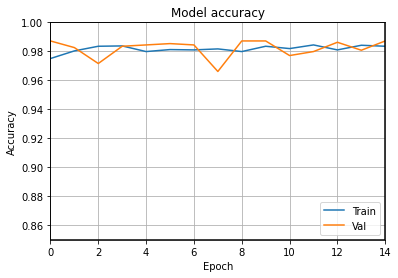

In [32]:
# Plot training and validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
axes = plt.gca()
axes.axvline(x=14, color='k')
axes.axhline(y=1, color='k')
axes.set_xlim([0,14])
axes.set_ylim([0.85,1])
axes.grid(True, which='both')
axes.axhline(y=0.85, color='k')
axes.axvline(x=0, color='k')
plt.legend(['Train','Val'], loc='lower right')
plt.show()

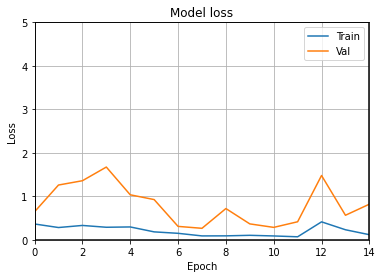

In [33]:
# Plot training and validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0,5])
axes.grid(True, which='both')
axes.axhline(y=0, color='k')
axes.axvline(x=0, color='k')
axes.axhline(y=5, color='k')
axes.axvline(x=14, color='k')
plt.legend(['Train','Val'], loc='upper right')
plt.show()

# Prediction

In [34]:
# Write the index of the test sample to test
prediction = model.predict(test_X[136:137])
prediction = prediction[0]
print('Prediction\n',prediction)
print('\nThresholded output\n',(prediction>0.5)*1)

Prediction
 [0.9933264]

Thresholded output
 [1]


# Ground truth

In [35]:
print(test_y[136:137])

5389    1.0
Name: isFake, dtype: float64


# Part 2: Saving, Loading Model

# Saving

In [36]:
# serialize model to JSON
model_json = model.to_json()

# Write the file name of the model

with open("model.json", "w") as json_file:
    json_file.write(model_json)
    
# serialize weights to HDF5
# Write the file name of the weights

model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


# Loading

In [37]:
# load json and create model

# Write the file name of the model

json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
# Write the file name of the weights

loaded_model.load_weights("model.h5")
print("Loaded model from disk")

Loaded model from disk
